**Author**: Yap Jheng Khin

**FYP II Title**: Used car dealership web application

**Purpose**:
1. This notebook explains:
    - The setup and validation of SHAP tree explainers.
    - The description and interpretation of beeswarm plot, feature importance bar plot, model loss bar plot, and model monitoring plot that are visualized at the model level (global explanation).
    - The disadvantage of the current model monitoring function and the enhancement of the model monitoring function. The validation of the both model monitoring functions under drifted & errored test set is conducted.
    - The description and interpretation of SHAP bar plot and SHAP loss bar plot that are visualized at the sample level (local explanation). 
2. Input: 
    - Car train and car test dataset. The <a href="https://colab.research.google.com/drive/1alFnJwZVOKntfmjxA0q8Rcni1irur5fn?usp=sharing">Google Colab notebook</a> explains how the data is scraped from a website and preprocessed.
    - Dictionary containing the extracted tree weights for car price adaptive random forest model.
    - The car price model predictions in `npy` format. Note that the model prediction is not performed here since it requires River library, which is not compatible with SHAP library.
3. Ouput
    - HTML codes and files that contain visualizations that are exported by Plotly.

**Execution time**: At most 10 minutes in Jupyter Notebook.

**Note**: Execute all the cells again every time the notebook is re-opened to re-display the Plotly visualization. 

# Setup

Ensure that the current Python interpreter path is correct. For example, if the **SHAP conda environment** is named as **arf_conda_exp_env**, the expected `sys.executable` should be C:\Users\User\miniconda3\envs\\**arf_conda_exp_env**\\python.exe.

In [1]:
import sys
print(sys.executable)

C:\Users\User\miniconda3\envs\arf_conda_exp_env\python.exe


In [2]:
# Standard libraries
import os
import pandas as pd
import pickle
import numpy as np
from scipy import stats as scipy_stats
import shap
import time
import json

import plotly.express as px
from shap.plots import colors as shap_colors


# User-defined libraries
from data_preprocessing import DataPreprocessor
from explainer_visualization import prettify_feature_labels, \
shap_api_beeswarm_plot, get_shap_color_scale, get_beeswarm_plot_data, \
plot_dataman_bar_plot, get_feature_importance_plot_data, get_shap_loss_plot_data, \
plot_shap_monitoring, plot_shap_monitoring_plot_plotly, plot_local_bar_plot_plotly, \
get_shap_monitoring_plot_data
from general_utils import deserialize_arf

**User Configuration**

Set the `AUTO_OPEN` to `True` if the reader wants the HTML visualizations to automatically open in the new tab for preview.

Set the `PRINT_HTML` to `True` if the read wants to print the HTML contents in the output. Note that some HTML contents is quite long.

In [3]:
AUTO_OPEN  = False
PRINT_HTML = False

In [4]:
RANDOM_SEED = 2022
OUT_PARENT_DIR = 'outputs'
OUT_CHILD_DIR = 'car_price_explainer'
OUT_FOLDER_PATH = os.path.join(OUT_PARENT_DIR, OUT_CHILD_DIR)

# Create directory if not exist
os.makedirs(OUT_FOLDER_PATH, exist_ok=True)

In [5]:
shap.initjs()

## Load Models

The dictionary containing the extracted weights for the car price model is loaded instead of the car price model itself. The details of the dictionary can be found in *FYP2_ARF_to_Dict_Conversion.ipynb*.

In [6]:
# Load car price ARF dictionary and its data preprocessor
with open('outputs/car_price/arf_rg.json', 'r') as f:
    cp_arf_dict_serializable = json.load(f)

cp_arf_dict = deserialize_arf(cp_arf_dict_serializable)

# Load data preprocessor
with open('outputs/car_price/data_preprocessor.pkl', 'rb') as f:
    cp_data_pp = pickle.load(f)

## Load Data

In this notebook, the car inventory information used to seed the database is loaded for demonstration purpose.
The car inventory information is filterd based on the following application logic:

> The car analytics will consider a car inventory record during training and evaluation if and only if the users set the `UpdateAnalytics` field to 1 in the record. 

This means that:
1. SHAP tree explainer will only consider the records which have the `UpdateAnalytics` value of 1. 
2. The PSI and Chi-square statistics and will only consider the records which have the `UpdateAnalytics` value of 0. 

In other words, the user-assigned price (a.k.a truth output) is available if and only if the `UpdateAnalytics` is 1 and vice versa. Note that the application logic is discussed in details in the FYP2 report.

The output below shows that half of the car inventory records contains the truth and vice versa. The car inventory records with the truth will be used for testing purposes. The result should be the same in the web application since these car inventory records are the exact data that seeded into the web application.

In [7]:
# Load car inventory records
car_records = pd.read_csv(f'outputs/seed_data/car_inventory_records.csv')

# Remove columns that are not needed to perform inference
car_test = car_records.copy().drop(columns=['model', 'pred_price', 'update_analytics'], axis=1)

cp_target_attr = 'price'
cp_X_test = car_test.drop(columns=cp_target_attr, axis=1)
cp_y_test = car_test[cp_target_attr]

# Preprocess the data
cp_X_test  = cp_data_pp.preprocess(cp_X_test)

In [8]:
truth_available = car_records['update_analytics'] == 1

cp_X_test_truth_av = cp_X_test.loc[truth_available, :].copy()
cp_y_test_truth_av = cp_y_test[truth_available].copy()
cp_X_test_no_truth = cp_X_test.loc[~truth_available, :].copy()

print(f'The no. of inventory records that have the truth: {cp_X_test_truth_av.shape[0]}')
print(f'The no. of inventory records that don\'t have the truth: {cp_X_test_no_truth.shape[0]}')

The no. of inventory records that have the truth: 547
The no. of inventory records that don't have the truth: 547


In [9]:
car_train = pd.read_csv(f'outputs/car_price/car_train_processed.csv')
# Shuffle the car records
rng = np.random.default_rng(RANDOM_SEED)
car_train = car_train.reindex(rng.permutation(car_train.index))
car_train = car_train.reset_index(drop=True)

# Remove columns that are not needed to perform inference
car_train = car_train.copy().drop(columns=['model'], axis=1)

cp_target_attr = 'price'
cp_X_train = car_train.drop(columns=cp_target_attr, axis=1)
cp_y_train = car_train[cp_target_attr]

# Preprocess the data
cp_X_train  = cp_data_pp.preprocess(cp_X_train)

# Tree Explainer Initialization

There are two approaches to build a tree SHAP explainer which are `tree_path_dependent` approach and `interventional` approach. `interventional` approach is much slower than `tree_path_dependent` approach. As a result, `tree_path_dependent` approach is always used except for explaining model loss. However, based on the analysis from *FYP2_Explainer_Validation.ipynb*, only the tree SHAP explainer with the `interventional` approach is used.

To initialize a tree SHAP loss explainer to monitor model loss, three conditions must be met as follows:
1. `interventional` approach must be used by setting `feature_perturbation` to `interventional`.
2. The parameter named `model_output` must be set to `log_loss`.
3. Background dataset must be provided when building the explainer. Scott Lundberg, who is the author of the SHAP library, does not recommend to provide more than 1000 random background samples since the running time scales linearly with the number of samples. The number of background samples can be as little as 100.
4. The truth outputs must be provided when calculating the SHAP values.

Randomly choose 100 samples from the test set to provide as a background dataset for the explainer.

In [10]:
num_subsamples = 100

cp_X_test_truth_av_subsample = pd.read_csv('outputs/car_price/X_test_truth_av_subsample.csv')

print(f'The size of the subsample: {cp_X_test_truth_av_subsample.shape}')

The size of the subsample: (100, 76)


Build a tree SHAP explainer that uses `interventional` approach.

In [11]:
cp_tree_explainer = shap.TreeExplainer(model = cp_arf_dict, 
                                       feature_perturbation = 'interventional', 
                                       data = cp_X_test_truth_av_subsample)
cp_shap_values = cp_tree_explainer.shap_values(cp_X_test_truth_av)

Build a tree SHAP loss explainer that uses `interventional` approach and the `model_output` is set to `log_loss`.

In [12]:
cp_tree_loss_explainer = shap.TreeExplainer(model = cp_arf_dict, 
                                            feature_perturbation = 'interventional', 
                                            model_output = 'log_loss',
                                            data = cp_X_test_truth_av_subsample)

cp_shap_loss_values = cp_tree_loss_explainer.shap_values(cp_X_test_truth_av, cp_y_test_truth_av)

## Validation

The expected value is calculated differently depending on the following approach: 
1. `interventional` approach: If the `model_output` is not set to `log_loss`, The expected value is exactly the average of all the model predictions on the provided background dataset, as documented in the <a href="https://github.com/slundberg/shap/blob/master/shap/explainers/_tree.py#L180">source code</a>. Else if the `model_output` is set to `log_loss`, the expected value is a function that returns the value based on the given label value, as documented in the <a href="">source code</a>.
2. `tree_path_dependent` approach: Since the background dataset is not available, the expected value is calculated by averaging the prediction values at the root node across all base learners, as documented in the <a href="https://github.com/slundberg/shap/blob/master/shap/explainers/_tree.py#L188">source code</a>.

Note that the background data should not be given if the `tree_path_dependent` approach is used since the background dataset will not always cover all the leaves in the model even the full training dataset is given.

Execute the code below and it will throw an assertion error and inform you to either switch to larger background dataset or use `interventional` approach.

```python
cp_tree_exp_data = shap.TreeExplainer(model = cp_arf_dict, data = cp_X_train, 
                                      feature_perturbation='tree_path_dependent')
cp_shap_values_2 = cp_tree_exp_data.shap_values(cp_X_test_truth_av)
```

The three tests below validate the SHAP explainer that uses `interventional` approach. Note that the model's prediction output is imported since River library is not available.

The three tests below are only valid if and only if the explainer uses `interventional` approach and the model_output is set to `raw`. There is no tests for the SHAP loss explainer that uses `interventional` approach and the model_output is set to `log_loss`. As of April 2022, the <a href="https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/tree_based_models/Explaining%20the%20Loss%20of%20a%20Model.html">official documentation</a> only provide an example of validation test on XGB gradient boosting classifier, but not classifiers like random forest classifier. The validation test cannot be used in both Scikit-learn random forest classifier and River adaptive random forest classifier since the SHAP loss value calculation is different for random forest models and gradient boosting models. Hence, the proposed three tests also serve as a proxy test for the explainer that uses `interventional` approach with the `model_output` set to `log_loss`. Furthermore, the <a href="https://github.com/slundberg/shap/blob/master/shap/explainers/_tree.py#L523">additivity check</a> is only conducted when the explainer uses `tree_path_dependent` approach or when the explainer uses `interventional` approach and the model_output is set to `raw`. In other words, there is no standardized test on validating the ingestion of tree classifiers into the explainers that use the `interventional` approach.

**Test 1**: Ensure that the expected value is equivalent to the average of all the model predictions on the provided background dataset.

The background dataset can be set to more than 100 samples. However, the test is not accurate since the average of model predictions is not computed on the whole dataset. If the provided sample count exceeds 100, the Tree SHAP initialization function will resample the background dataset down to 100 samples as documented in the <a href="https://github.com/slundberg/shap/blob/master/shap/maskers/_tabular.py#L54">source code</a>. It is because the object that mask the dataset, `shap.maskers._tabular.Independent` class instance, is initialized with 100 max samples and cannot be adjusted by the API users (as of SHAP 0.40.0). Hence, only a maximum of 100 samples out of the background dataset is used in calculating the expected value. 

For sample count that exceeds 100, ensure that the expected value is equivalent to the average of all the model predictions on the **resampled** background dataset. To get the masked/resampled dataset, execute the code below.

> cp_tree_explainer.masker.data

In [13]:
with open('outputs/car_price/y_test_truth_av_subsample-prediction.npy', 'rb') as f:
    cp_y_test_truth_av_subsample_pred = np.load(f)

# Compute the average of River model prediction on the background dataset
true_y_pred_mean = cp_y_test_truth_av_subsample_pred.mean(0)

print(f'Is expected value == the average of all the model predictions on the background dataset'+\
      ' across all base learners?: '+\
      f'{true_y_pred_mean - cp_tree_explainer.expected_value < 1e-4}')
print(f'\n\tThe expected value in the explainer is {cp_tree_explainer.expected_value}.')

Is expected value == the average of all the model predictions on the background dataset across all base learners?: True

	The expected value in the explainer is 77597.37338394823.


**Test 2**: Ensure that the ingested SHAP model (a TreeEnsemble object) makes the same predictions as the original model.

In [14]:
# Original model's prediction output
with open('outputs/car_price/y_test_truth_av-prediction.npy', 'rb') as f:
    cp_y_test_truth_av_pred = np.load(f)

true_y_pred = cp_y_test_truth_av_pred

# Ingested model's prediction output
y_pred_fr_ingested_model = cp_tree_explainer.model.predict(cp_X_test_truth_av)

largest_diff = np.abs(true_y_pred - y_pred_fr_ingested_model).max()

print(f'Does the ingested SHAP model make the same predictions as the original model?:'+\
      f' {largest_diff < 1e-4}')
print(f'\n\tThe largest difference is {largest_diff}.')

Does the ingested SHAP model make the same predictions as the original model?: True

	The largest difference is 8.731149137020111e-11.


**Test 3**: For each sample, ensure that the sum of the SHAP values equals to the difference between model output and the expected value. The output below shows some noticeable differences (> 1e-4). 

In [15]:
# Original model's prediction output
true_y_pred = cp_y_test_truth_av_pred

# Sum of the SHAP values and the expected value
y_pred_calulated_fr_shap_val = cp_tree_explainer.expected_value + cp_shap_values.sum(1)

largest_diff = np.abs(true_y_pred - y_pred_calulated_fr_shap_val).max()

print(f'model prediction output == expected value + sum of SHAP value of all features?: '+\
      f'{largest_diff < 1e-4}')
print(f'\n\tThe largest difference is {largest_diff}.')

model prediction output == expected value + sum of SHAP value of all features?: False

	The largest difference is 0.009681115567218512.


Since this is a regression problem, the difference is negligible since the prediction value is around thousands. However, this might not be the case for classification problem.

In [16]:
pd.DataFrame(true_y_pred).describe()

,0
count,547.000000
mean,74419.162247
std,65130.035797
min,6270.508217
25%,33853.187342
50%,53134.687051
75%,91873.154158
max,402851.861529


# Utilities

The author used Plotly library instead of using the SHAP library to construct plots like beeswarm plot and waterfall plot. 

It is because Plotly provides functionalities as shown below:
1. Building on top of Plotly JavaScript library (plotly.js), the plot can be constructed and configured in Python (plotly.py) before converting to JavaScript code. The plot can then be exported to a div element and display within a HTML document.
2. As compared to Chart.js, Plotly can enhance user experience with minimum development effort. It is because Plotly provides a rich set of functionalities such as image downloading, zooming, and data hovering with little or no configuration. 

All the plots are inspired from the SHAP library maintained by Scott Lundberg. The author has to re-implement the visualization in Plotly since Scott Lundberg uses Matplotlib. For some plots like beeswarm plot, the author deliberately extracts Lundberg's code into a separate function to understand code logic and validate the re-implementation.

The code below shows the function(s) needed for all the visualizations below. 

The rest of the utilities functions can be found in `explainer_visualization.py`.

In [17]:
feature_label_names = {
    'manufacture_year': 'Manufacture Year',
    'mileage': 'Mileage',
    'length_mm': 'Length (mm)',
    'engine_cc': 'Engine (CC)',
    'aspiration': 'Aspiration',
    'wheel_base_mm': 'Wheel Base (mm)',
    'width_mm': 'Width (mm)',
    'direct_injection': 'Direct Injection',
    'seat_capacity': 'Seat Capacity',
    'peak_power_hp': 'Peak Power Hp',
    'fuel_type': 'Fuel Type',
    'steering_type': 'Steering Type',
    'assembled': 'Assembled',
    'height_mm': 'Height (mm)',
    'peak_torque_nm': 'Peak Torque (nm)',
    'doors': 'Doors',
    'brand': 'Brand',
    'colour': 'Color',
    'model': 'Model',
    'transmission': 'Transmission'
}

# Global Explanation

## Beeswarm plot

Using explainer with `tree_path_dependent` approach, the SHAP values of each sample are calculated and individually plotted as a single dot to form a dense data that is grouped by feature. To prevent data points plotting on top of one another, random jittering effect is applied to moved the data points away from one another to prevent overlapping. As a result, the dense data points look like a beeswarm instead of a straight line. Beeswarm plot can be used to visualize the feature importance and correlation for each individual sample.

The x-axis shows the SHAP values and the y-axis shows the car specifications. The feature with the highest summed absolute SHAP values is displayed at the top, followed by the next highest summed absolute SHAP values in a top-down fashion. A scatterplot is drawn for each car specification, where the feature value of each sample is plotted as a point. The feature value is represented by the colour ranging from blue to red. The more reddish the point's colour, the higher the feature value for that sample. The opposite case is true for the bluish colour. The continous colour scale allows the viewer to infer whether the feature is positively or negatively correlated with the prediction output.

Below is some examples on how to interpret the beeswarm plot:
1. `Manufacture Year` is the most important feature in determining the price.
2. Features like `Manufacture Year`, `Width (mm)`, and `Peak Power Hp` are positively correlated with car price. It is because most red points are concentrated on the right side and most blue points are concentrated on the left side.
3. Feature like `Direct Injection_Multi-Point Injected`, `Mileage`, and `Fuel Type_Diesel` are negatively correlated with car price. It is because most red points are concentrated on the left side and most blue points are concentrated on the right side.
4. Higher `Manufacture Year` correlates with higher car price. The model predicts high car price when the value of the `Manufacture Year` is high. 
5. The `Direct Injection_Multi-Point Injected` feature negatively correlates with the car price. The model predicts lower car price when the value of the category value of `Direct Injection` is `Multi-Point Injected`.

Note that the categorical feature is formatted such that the categorical feature and its categorical value separated with an underscore.

Below is the Plotly implementation of beeswarm plot.

In [18]:
axis_color="#333333"

shap_color_scale = get_shap_color_scale(shap_colors.red_blue)

beeswarm_plot_data, y_tick_labels = get_beeswarm_plot_data(cp_X_test_truth_av, cp_shap_values)

y_tick_labels = prettify_feature_labels(y_tick_labels, feature_label_names)

fig = px.scatter(beeswarm_plot_data, color_continuous_scale = shap_color_scale,
                 x='shap_values', y='y_locations', color='color_values', 
                 labels=dict(shap_values = 'SHAP value (impact on model output)', y_locations="")
                )

fig.update_layout(
    width = 750,
    height = 1000,
    showlegend = False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis = dict(
        ticks = 'outside',
        # Set the tick color and the tick label color to lighter dark colour
        tickcolor = axis_color,
        tickfont_color = axis_color,
        showline = True,
        linewidth = 1, 
        linecolor = axis_color
    ),
    yaxis = dict(
        tickmode = 'array',
        tickvals = list(range(len(y_tick_labels))),
        # Set the tick color and the tick label color to lighter dark colour
        ticktext = y_tick_labels,
        tickfont_color = axis_color,
        range = [-1, len(y_tick_labels)]
    ),
    coloraxis = dict(
        colorbar_title_text = 'Feature value',
        colorbar_title_side = 'right',
        colorbar_tickmode = 'array',
        colorbar_tickvals = [0.0, 1.0],
        colorbar_ticktext = ['Low', 'High'],
        colorbar_thickness = 15
    )
)

fig.update_traces(
    customdata = beeswarm_plot_data["feature_values"],
    hovertemplate = \
    '<i>Feature value</i>: %{customdata:.0f}<br>'+
    '<i>SHAP value</i>: %{x:.0f}<br>'
)

fig.add_shape(
    type = "line",
    x0 = 0, y0 = -1, x1 = 0, y1 = len(y_tick_labels),
    line=dict(
        color = axis_color, 
        width = 1
    ),
    opacity = 0.5
)

fig.show()

Below is the Matplotlib implementation of beeswarm plot extracted from Lundberg's code.

Run the code below to directly compare the re-implementaton with the API instead.

> shap.summary_plot(cp_shap_values, cp_X_test_truth_av)

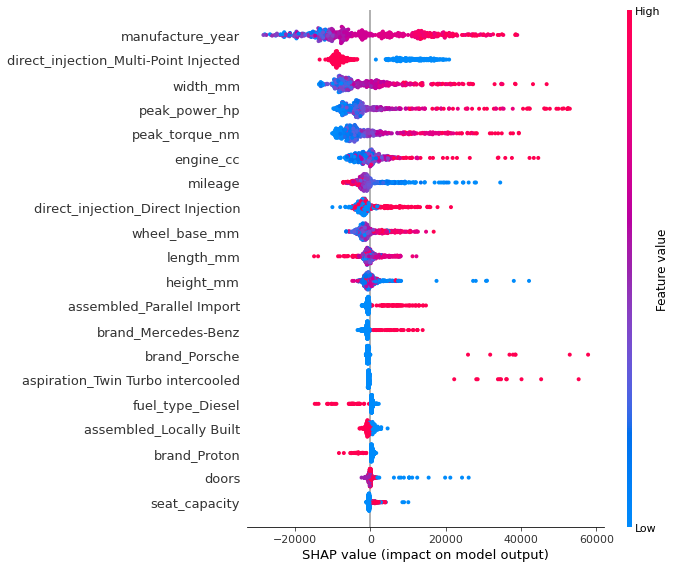

In [19]:
shap_api_beeswarm_plot(features = cp_X_test_truth_av, shap_values = cp_shap_values)

The Plotly figure is exported to a HTML document for preview. 

In [20]:
fig.write_html(
    file = f'{OUT_FOLDER_PATH}/beeswarm_plot_full.html', 
    include_plotlyjs=True, 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=True, 
    auto_open=AUTO_OPEN, 
)

The Plotly figure is exported to a div element. A script tag that contains the JavaScript code to construct the Plotly figure in that div element is also exported as well.

In [21]:
fig_html = fig.to_html(
    include_plotlyjs='cdn', 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=False, 
)

print(f'The size of the HTML code is {round(len(fig_html.encode("utf-8"))/1000, 1)}KB.')
if PRINT_HTML:
    print(fig_html)

The size of the HTML code is 538.1KB.


## Feature importance bar plot

Using explainer with `tree_path_dependent` approach, the SHAP values of each sample are calculated and summed up by feature.  Bar plot can be used to visualize the feature importance and correlation by calculating the sum of the absolute SHAP values for each feature.

The x-axis shows the SHAP values and the y-axis shows the car specifications. The feature with the highest summed absolute SHAP values is displayed at the top, followed by the next highest summed absolute SHAP values in a top-down fashion. The red bar represents positive correlation between the feature and the target while the blue bar represents the negative correlation between the feature and the target.

Below is some examples on how to interpret the beeswarm plot:
1. `Manufacture Year` is the most important feature in determining the price. It is because `Manufacture Year` has the longest bar length. 
2. Features like `Manufacture Year`, `Width (mm)`, and `Peak Power Hp` are positively correlated with car price. It is because the bars are coloured in red.
3. Features like `Direct Injection_Multi-Point Injected`, `Mileage`, and `Fuel Type_Diesel` are negatively correlated with car price. It is because the bars are coloured in blue.

Note that the categorical feature is formatted such that the categorical feature and its categorical value separated with an underscore.

In [22]:
fi_plot_data = get_feature_importance_plot_data(cp_X_test_truth_av, cp_shap_values)

y_tick_labels = prettify_feature_labels(fi_plot_data['Variable'], feature_label_names)

fig = px.bar(fi_plot_data, 
             x='SHAP_abs', 
             y='Variable', 
             orientation='h', 
             labels=dict(SHAP_abs = 'Sum of absolute SHAP values (red: positive correlation)', 
                         Variable=""))

fig.update_layout(
    width = 800,
    height = 600,
    showlegend = False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis = dict(
        ticks = 'outside',
        # Set the tick color and the tick label color to lighter dark colour
        tickcolor = axis_color,
        tickfont_color = axis_color,
        showline = True,
        linewidth = 1, 
        linecolor = axis_color, 
        range = [-np.max(fi_plot_data['SHAP_abs']) * 0.03, np.max(fi_plot_data['SHAP_abs']) * 1.1]
    ),
    yaxis = dict(
        # Set the tick color and the tick label color to lighter dark colour
        tickmode = 'array',
        tickcolor = axis_color,
        tickfont_color = axis_color,
        tickvals = list(range(len(fi_plot_data['Variable']))),
        ticktext = prettify_feature_labels(fi_plot_data['Variable'], feature_label_names),
        range = [-1, fi_plot_data.shape[0]]
    )
)

fig.add_shape(
    type = "line",
    x0 = 0, y0 = -1, x1 = 0, y1 = fi_plot_data.shape[0],
    line=dict(
        color = axis_color, 
        width = 1
    ),
    opacity = 0.5
)

fig.update_traces(hovertemplate = '<i>Feature:</i> %{y}<br><i>Sum of SHAP absolute values</i>: %{x:.0f}<br>')

fig.update_traces(
    marker_color = fi_plot_data['Sign'], 
)

fig.show()

Below is the Matplotlib implementation of bar plot extracted from Lundberg's code. The author adds an additional plot logic such that the red bar represents positive correlation between the feature and the target. The opposite case is true for the blue bar. The plot is inspired from Dr. Dataman's article, which can be found at https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

Run the code below to directly compare the re-implementaton with the API instead. 

> shap.summary_plot(cp_shap_values, cp_X_test_truth_av, plot_type="bar")

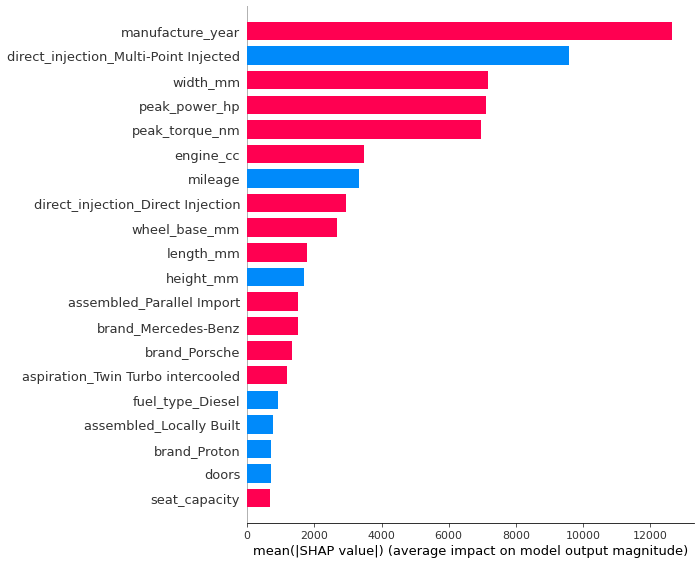

In [23]:
plot_dataman_bar_plot(cp_X_test_truth_av, cp_shap_values)

The Plotly figure is exported to a HTML document for preview.

In [24]:
fig.write_html(
    file = f'{OUT_FOLDER_PATH}/fi_bar_plot_full.html', 
    include_plotlyjs=True, 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=True, 
    auto_open=AUTO_OPEN, 
)

The Plotly figure is exported to a div element. A script tag that contains the JavaScript code to construct the Plotly figure in that div element is also exported as well.

In [25]:
fig_html = fig.to_html(
    include_plotlyjs='cdn', 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=False, 
)

print(f'The size of the HTML code is {round(len(fig_html.encode("utf-8"))/1000, 1)}KB.')
if PRINT_HTML:
    print(fig_html)

The size of the HTML code is 10.2KB.


## Model loss bar plot

Using explainer with `interventional` approach, the SHAP loss value of each sample are calculated. In every sample, the features with positive SHAP loss values increase the prediction error while features with negative SHAP loss values decrease the prediction error. According to Chuangxin Lin, a bar plot can be constructed to visualize the summed positive/negative SHAP loss value across all features. A positive SHAP loss bar plot can provide information on which features contribute the most model error,  while a negative SHAP loss bar plot can provide information on which features help the most in reducing the model error.

To achieve better model performance, the data scientists should figure out ways to reduce both the positive SHAP loss values and negative SHAP loss values for as many samples as possible.

Note that the categorical feature is formatted such that the categorical feature and its categorical value separated with an underscore.

### Positive model loss

Below is one of the ways to interpret the positive SHAP loss bar plot:
1. `Manufacture Year` contributes the most errors in the car price predictions. Based on the beeswarm plot and the feature importance bar plot, `Manufacture Year` is also contributing the most values in the predicted car prices. This might suggest that the model relies too heavily on this feature to predict the car price. Further model inspection is required by the data scientists to investigate the issue. The investigation is not covered since it is out of scope.

In [26]:
plotly_plot_data = get_shap_loss_plot_data(cp_X_test_truth_av, 
                                           cp_shap_loss_values, 
                                           shap_loss_type = 'positive', 
                                           plot = False)

fig = px.bar(plotly_plot_data, 
             x='feature', 
             y='shap_value', 
             labels=dict(shap_value = 'Sum of Positive SHAP loss value', feature=""))

fig.update_layout(
    width = 800,
    height = 700,
    showlegend = False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis = dict(
        ticks = 'outside',
        tickangle = -45,
        # Set the tick color and the tick label color to lighter dark colour
        tickcolor = axis_color,
        tickfont_color = axis_color,
        tickmode = 'array',
        tickvals = list(range(len(plotly_plot_data['feature']))),
        ticktext = prettify_feature_labels(plotly_plot_data['feature'], 
                                           feature_label_names),
        range = [-1, plotly_plot_data.shape[0]]
    ),
    yaxis = dict(
        # Set the tick color and the tick label color to lighter dark colour
        tickcolor = axis_color,
        tickfont_color = axis_color,
        showline = True,
        linewidth = 1, 
        linecolor = axis_color
    )
)

fig.update_traces(hovertemplate = '<i>Feature:</i> %{x}<br><i>Sum of SHAP loss values</i>: %{y:.0f}<br>')

fig.show()

Set the `plot` to `True` to display the bar plot using Pandas API. The source code of the plot is originated from Chuangxin Lin, which can be found at https://towardsdatascience.com/use-shap-loss-values-to-debug-monitor-your-model-83f7808af40f

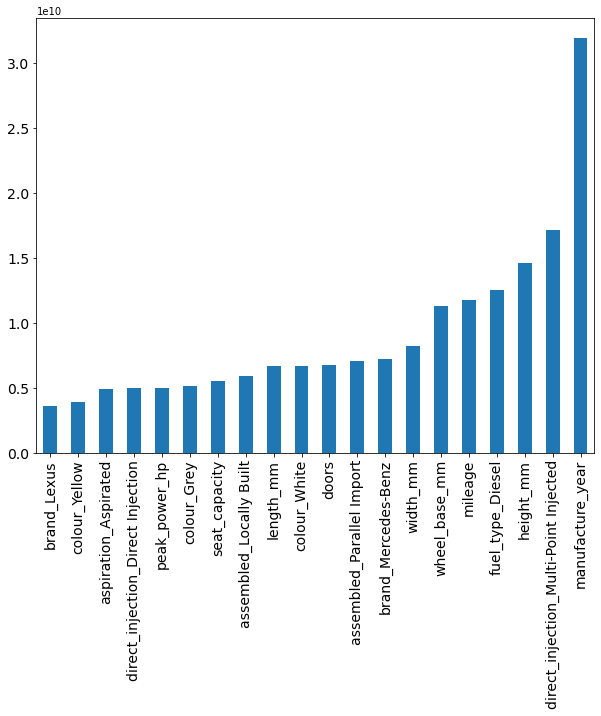

In [27]:
_ = get_shap_loss_plot_data(cp_X_test_truth_av, 
                            cp_shap_loss_values, 
                            shap_loss_type = 'positive', 
                            plot = True)

The Plotly figure is exported to a HTML document for preview.

In [28]:
fig.write_html(
    file = f'{OUT_FOLDER_PATH}/pos_model_loss_plot_full.html', 
    include_plotlyjs=True, 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=True, 
    auto_open=AUTO_OPEN, 
)

The Plotly figure is exported to a div element. A script tag that contains the JavaScript code to construct the Plotly figure in that div element is also exported as well.

In [29]:
fig_html = fig.to_html(
    include_plotlyjs='cdn', 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=False, 
)

print(f'The size of the HTML code is {round(len(fig_html.encode("utf-8"))/1000, 1)}KB.')
if PRINT_HTML:
    print(fig_html)

The size of the HTML code is 9.8KB.


### Negative model loss

Below is one of the ways to interpret the negative SHAP loss bar plot:
1. `Peak Power Hp` and `Manufacture Year` helps the most in reducing the model error. 
2. Combining the insights from the positive SHAP loss bar plot, `Manufacture Year` is relevant in predicting car prices for some samples but not the others. Further model inspection is required by the data scientists to investigate why `Manufacture Year` is irrelevant in predicting those samples. The investigation is not covered since it is out of scope.

Note that the result is not contradictory. It is because the positive SHAP loss bar plot only sums up positive SHAP values for each feature in each sample, while negative SHAP loss bar plot only sums up negative SHAP values.

In [30]:
plotly_plot_data = get_shap_loss_plot_data(cp_X_test_truth_av, 
                                           cp_shap_loss_values, 
                                           shap_loss_type = 'negative', 
                                           plot = False)

fig = px.bar(plotly_plot_data, 
             x='feature', 
             y='shap_value', 
             labels=dict(shap_value = 'Sum of Negative SHAP loss value', feature=""))

fig.update_layout(
    width = 800,
    height = 700,
    showlegend = False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis = dict(
        ticks = 'outside',
        side = 'top',
        tickangle = -45,
        # Set the tick color and the tick label color to lighter dark colour
        tickcolor = axis_color,
        tickfont_color = axis_color,
        tickmode = 'array',
        tickvals = list(range(len(plotly_plot_data['feature']))),
        ticktext = prettify_feature_labels(plotly_plot_data['feature'], 
                                           feature_label_names),
        range = [-1, plotly_plot_data.shape[0]]
    ),
    yaxis = dict(
        # Set the tick color and the tick label color to lighter dark colour
        tickcolor = axis_color,
        tickfont_color = axis_color,
        showline = True,
        linewidth = 1, 
        linecolor = axis_color
    )
)

fig.update_traces(hovertemplate = '<i>Feature:</i> %{x}<br><i>Sum of SHAP loss value</i>: %{y:.0f}<br>')

fig.show()

Set the `plot` to `True` to display the bar plot using Pandas API. The source code of the plot is originated from Chuangxin Lin, which can be found at https://towardsdatascience.com/use-shap-loss-values-to-debug-monitor-your-model-83f7808af40f

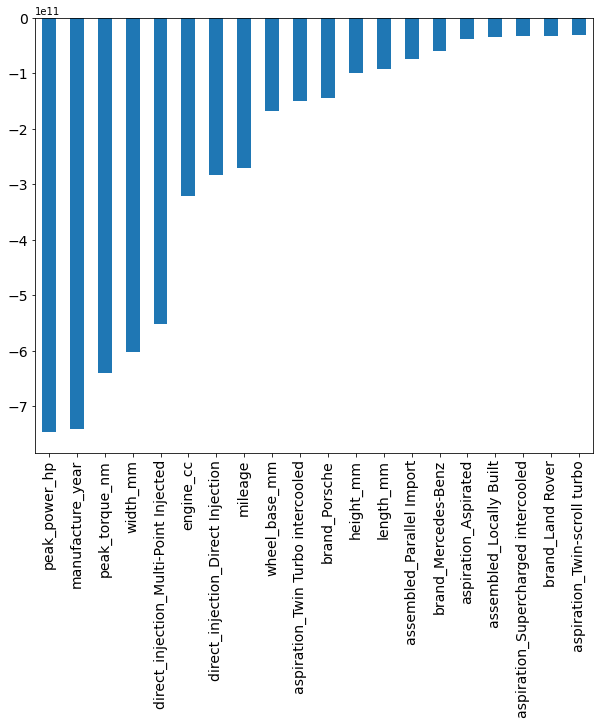

In [31]:
_ = get_shap_loss_plot_data(cp_X_test_truth_av, 
                            cp_shap_loss_values, 
                            shap_loss_type = 'negative', 
                            plot = True)

The Plotly figure is exported to a HTML document for preview.

In [32]:
fig.write_html(
    file = f'{OUT_FOLDER_PATH}/neg_model_loss_plot_full.html', 
    include_plotlyjs=True, 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=True, 
    auto_open=AUTO_OPEN, 
)

The Plotly figure is exported to a div element. A script tag that contains the JavaScript code to construct the Plotly figure in that div element is also exported as well.

In [33]:
fig_html = fig.to_html(
    include_plotlyjs='cdn', 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=False, 
)

print(f'The size of the HTML code is {round(len(fig_html.encode("utf-8"))/1000, 1)}KB.')
if PRINT_HTML:
    print(fig_html)

The size of the HTML code is 10.0KB.


## Model monitoring plot

In [34]:
help(shap.monitoring_plot)

Help on function monitoring in module shap.plots._monitoring:

monitoring(ind, shap_values, features, feature_names=None, show=True)
    Create a SHAP monitoring plot.
    
    (Note this function is preliminary and subject to change!!)
    A SHAP monitoring plot is meant to display the behavior of a model
    over time. Often the shap_values given to this plot explain the loss
    of a model, so changes in a feature's impact on the model's loss over
    time can help in monitoring the model's performance.
    
    Parameters
    ----------
    ind : int
        Index of the feature to plot.
    
    shap_values : numpy.array
        Matrix of SHAP values (# samples x # features)
    
    features : numpy.array or pandas.DataFrame
        Matrix of feature values (# samples x # features)
    
    feature_names : list
        Names of the features (length # features)



As shown in the output above, the SHAP monitoring plot is still in development and subject to change as of April 2022. The reviewed SHAP package version is 0.40.0. The full source code can be found at the <a href="https://github.com/slundberg/shap/blob/master/shap/plots/_monitoring.py#L60">GitHub repository</a>. 

Regardless, the author decides to test the preliminary function and check its accuracy in detecting model drift. Below is the over-simplified pseudocode on how the monitoring function will raise an alarm if drift or error is detected in the evaluation set. The validation set is the data used in model training or model evaluation before deployment, while the evaluation set is the real-world data that might have drifted or contain error. 

```
LET shap_values be shap_values for both validation set and evaluation set
LET features    be features    for both validation set and evaluation set

LET start_index at the 50th sample
Split the list into two partitions

WHILE number of samples at the next partition >= 1:
    Calculate the Welch's t-test and its p-value on SHAP loss means difference on both partitions
    Update the smallest p-value that has seen so far
    Extend the first partition by 50 samples and shrink the next partition by 50 samples

IF the smallest p-value <= 5%:
    Raise the alarm

Plot the graph
```

As explained above, the function tries to find the best partition split where the difference of SHAP mean values on both partitions is the most statistically significant. The disadvantage of the algorithm is that Type 1 error and Type 2 error are inevitable since t-test statistics are used. The p-value can be adjusted accordingly to control the Type 1 error and Type 2 error.

For monitoring the car price model, one of the independent group is the train set and the other is the incoming application data. In production environment where new data is always available, the members in both independent groups should be dynamically updated using techniques like sliding window.

### Monitor Test Set

To check the accuracy of model monitoring by Scott Lundberg, the author passed in SHAP loss values that consist of train set and test set as the monitoring input. The SHAP loss values for train set are calculated using a different explainer that has its own background dataset sampled from the train set. 

**Setup 1**: Build a tree explainer that uses `interventional` approach for train set.

Randomly choose 100 samples from the train set to provide as a background dataset for the explainer.

In [35]:
rng = np.random.default_rng(RANDOM_SEED)
idx_arr = rng.choice(range(len(cp_X_train)), num_subsamples)

# Randomly choose 100 samples from the train set
cp_X_train_subsample = cp_X_train.iloc[idx_arr, :].copy()

print(f'The size of the subsample: {cp_X_train_subsample.shape}')

tree_loss_explainer_train = shap.TreeExplainer(
    model = cp_arf_dict, 
    feature_perturbation = 'interventional', 
    model_output = 'log_loss',
    data = cp_X_train_subsample)

cp_shap_loss_values_train = tree_loss_explainer_train.shap_values(cp_X_train, cp_y_train)

The size of the subsample: (100, 76)


 98%|===================| 8344/8533 [00:25<00:00]        

**Setup 2**: Build a tree explainer that uses `interventional` approach for test set.

The tree explainer that uses interventional approach has already been initialized for test set in the "Tree Explainer Initialization" section. 

The result showed that 10 out of 76 alarms are triggered. The alarm may be a true positive or a false positive, so it is up to the data scientists to investigate and debug the model.

In [36]:
# Calculate t-test statistics on SHAP loss values between the train set and test set
t_tests_train_vs_test = pd.DataFrame(columns=['feature_name', 'p_val', 'stats'])

features = cp_X_train.columns

for idx, feature_name in enumerate(features):
    feature_idx = cp_X_train.columns.get_loc(feature_name)
    stat, p_val = scipy_stats.ttest_ind(cp_shap_loss_values_train[feature_idx], 
                                        cp_shap_loss_values[feature_idx], 
                                        equal_var = False # Use Welch's t-test
                                       )
    t_tests_train_vs_test.loc[idx] = [feature_name, p_val, stat]

num_alarm_triggered = np.sum(t_tests_train_vs_test["p_val"] < 0.05)
print('T-test statistics on SHAP loss values between train set and test set')
print(f'\nNumber of alarms triggered: {num_alarm_triggered} out of {len(features)}')

T-test statistics on SHAP loss values between train set and test set

Number of alarms triggered: 10 out of 76


The monitoring plots on SHAP loss values of `manufacture_year`, `mileage`, `brand_Proton`, and `brand_Mercedes-Benz` are constructed as shown below. The presence of a vertical line that separates the two partitions, like the one shown in the monitoring plot for `brand_Mercedes-Benz`, indicates that there is statistically significant mean difference between those partitions.

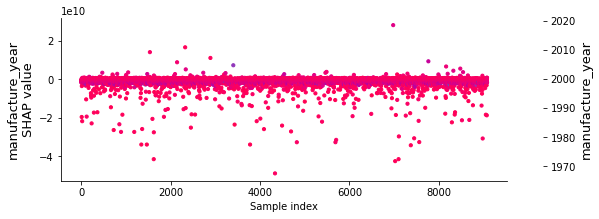

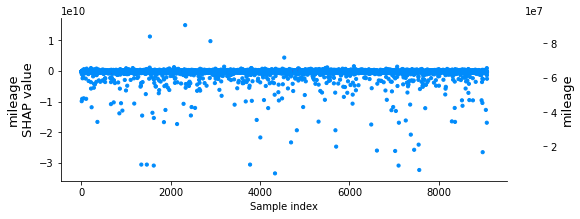

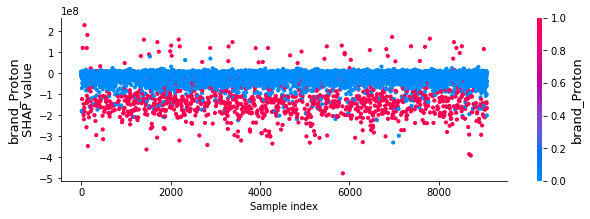

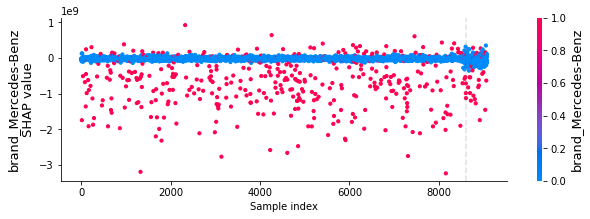

In [37]:
modified_features = ['manufacture_year', 'mileage', 'brand_Proton', 'brand_Mercedes-Benz']

for feature_name in modified_features:
    feature_idx = cp_X_train.columns.get_loc(feature_name)
    shap.monitoring_plot(
        ind=feature_idx, 
        shap_values=np.vstack((cp_shap_loss_values_train, cp_shap_loss_values)), 
        features= pd.concat((cp_X_train, cp_X_test_truth_av)), 
        feature_names=cp_X_train.columns
    )

### Monitor Drifted Test Set

Due to the absence of drifted data, the existing test set is manually modified to <u>test the effectivenss of the model monitoring plot against drift or data error</u>. The modifications are stated below:

1. To simulate data error for categorical features, all the values for label `brand_Proton` is converted to 0. This might happen when there is a logic error in persisting the car inventory record to the database.
2. To simulate data error for numerical features, the value of the `mileage` is converted from kilometer to miles. This might happen when the users enter the `mileage` in miles in the web application.
3. To simulate gradual feature drift, the rows are separated into five stages. In each stage, the rows' `manufacture_year` field values are incremented by \[0, 2\] * constant. Each subsequent stage adds the constant by 1.

In [38]:
cp_X_test_drifted = cp_X_test_truth_av.copy()

# Simulate data error for categorical features 
# The the label 'brand_Proton' is set to zero
cp_X_test_drifted.loc[:, 'brand_Proton'] = 0

# Simulate data error for numerical features 
# Device the mileage by 1.609
# Assuming that the users accidentally enter miles instead of kilometer
cp_X_test_drifted['mileage'] /= 1.609

# Simulate gradual feature drift
# Gradually drift the manufacture year in 5 stages
# Each stages will increase the year offsets by 1
# Assuming that the car price model has already been used for years
# Car inventory information with higher `manufacture_year` is observed more frequently 
num_samples = len(cp_X_test_drifted)
period = 5
data_gap = round(num_samples / period, -1)
years_coeff = (0, 2)
rng = np.random.default_rng(RANDOM_SEED)

for i in range(period):
    # Update the offset of manufacture years by 1
    years_coeff = (years_coeff[0]+1, years_coeff[1]+1)
    # Update the start and end index
    start = i*data_gap
    end = (i+1)*data_gap
    cur_sample_count = len(cp_X_test_drifted.loc[start:end])
    years_offset = rng.choice(range(years_coeff[0], years_coeff[1]), size=cur_sample_count)
    cp_X_test_drifted.loc[start:end, 'manufacture_year'] += years_offset

Build a tree explainer that uses `interventional` approach for **drifted** test set.

Randomly choose 100 samples from the train set to provide as a background dataset for the explainer.

In [39]:
rng = np.random.default_rng(RANDOM_SEED)
idx_arr = rng.choice(range(len(cp_X_test_drifted)), num_subsamples)

# Randomly choose 100 samples from the test_drifted set
cp_X_test_drifted_subsample = cp_X_test_drifted.iloc[idx_arr, :].copy()

print(f'The size of the subsample: {cp_X_test_drifted_subsample.shape}')

tree_loss_explainer_test_drifted = shap.TreeExplainer(
    model = cp_arf_dict, 
    feature_perturbation = 'interventional', 
    model_output = 'log_loss',
    data = cp_X_test_drifted_subsample)

cp_shap_loss_values_test_drifted = tree_loss_explainer_test_drifted.shap_values(cp_X_test_drifted, cp_y_test_truth_av)

The size of the subsample: (100, 76)


The result showed that 13 out of 76 alarms are triggered. The alarm may be a true positive or a false positive, so it is up to the data scientists to investigate and debug the model.

In [40]:
# Calculate t-test statistics on SHAP loss values between the train set and test set
t_tests_train_vs_test_drifted = pd.DataFrame(columns=['feature_name', 'p_val', 'stats'])

features = cp_X_train.columns

for idx, feature_name in enumerate(features):
    feature_idx = cp_X_train.columns.get_loc(feature_name)
    stat, p_val = scipy_stats.ttest_ind(cp_shap_loss_values_train[feature_idx], 
                                        cp_shap_loss_values_test_drifted[feature_idx], 
                                        equal_var = False # Use Welch's t-test
                                       )
    t_tests_train_vs_test_drifted.loc[idx] = [feature_name, p_val, stat]

num_alarm_triggered = np.sum(t_tests_train_vs_test_drifted["p_val"] < 0.05)
print('T-test statistics on SHAP loss values between train set and test set')
print(f'\nNumber of alarms triggered: {num_alarm_triggered} out of {len(features)}')

T-test statistics on SHAP loss values between train set and test set

Number of alarms triggered: 13 out of 76


The monitoring plots on SHAP loss values of `manufacture_year`, `mileage`, and `brand_Proton` are constructed as shown below. It is expected that each of these plots has a vertical line since all the feature values have been modified. 

However, the independent t-test statistics has failed to measure the mean difference for `manufacture_year` and `mileage` between the train data and the drifted test data. In other words, these alarms have failed to be triggered and are false negatives.


For model monitoring and debugging, a false positive alarm is always better than a false negative alarm. Hence, the algorithm must be enhanced to reduce the likelihood of having false negatives, even at the cost of higher likelihood of having false positives.

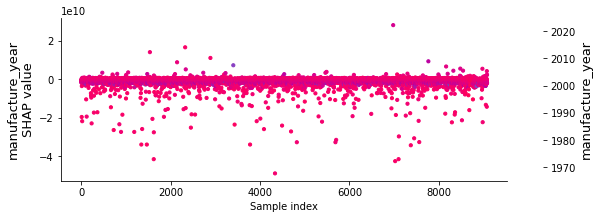

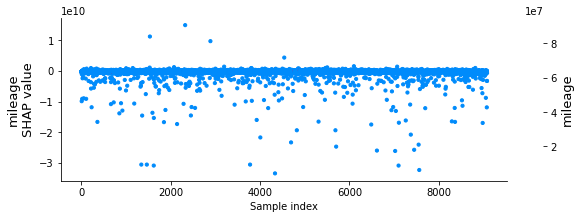

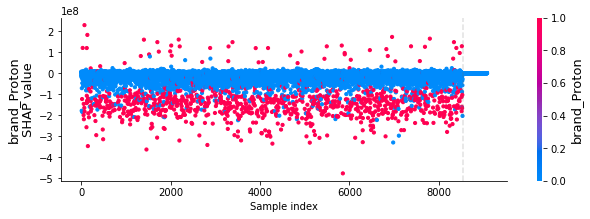

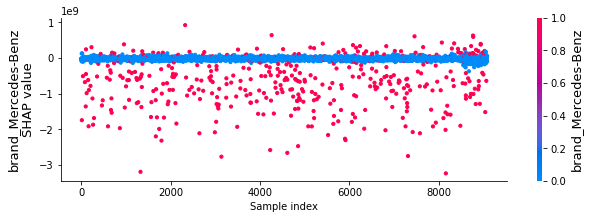

In [41]:
for feature_name in modified_features:
    feature_idx = cp_X_train.columns.get_loc(feature_name)
    shap.monitoring_plot(
        ind=feature_idx, 
        shap_values=np.vstack((cp_shap_loss_values_train, cp_shap_loss_values_test_drifted)), 
        features= pd.concat((cp_X_train, cp_X_test_drifted)), 
        feature_names=cp_X_train.columns
    )

### Enhancement

The data scientists will not know about the feature drifts in `manufacture_year` and data errors in `mileage` unless they painstakingly visualize a total of 76 model monitoring plots one at a time. It is because the model monitoring plot cannot raise an alarm to alert feature drifts or data errors as the SHAP loss means' difference between the train set and drifted test set is not statistically significant.

To reduce the likelihood of such false negative scenarios:

1. For categorical features, the **chi-square goodness of fit test** can be calculated to determine if there is any statistically significant difference between feature value counts in the train set and the drifted test set. The result showed that the difference is statistically significant with a p-value of 2.597953e-17.
2. For numerical features, the **Welch's t-test** can be calculated to determine if the mean difference between feature values in trian set and drifted test set is statistically significant. The result showed that the difference is statistically significant with a p-value of 1.722e-129.

Below shows the calculation of chi-square goodness of fit test for `brand_Proton` using `scipy.stats.chisquare` function.

To use the API, it must be ensured that the sum of the observed frequencies must agree with the sum of the expected frequencies to a relative tolerance of 1e-08.

The chi-square value is manually calculated instead of using the API, since sometimes the API unexpectedly produces wrong results. However, the p-value is still obtained from `scipy.stats.chi2.sf` API.

In [42]:
cat_feature_name = 'brand_Proton'

obs_val_counts = cp_X_test_drifted[cat_feature_name].value_counts().to_dict()
exp_val_counts = cp_X_train[cat_feature_name].value_counts(normalize=True).to_dict()
old_exp_val_counts = cp_X_train[cat_feature_name].value_counts(normalize=False).to_dict()
scale = sum(obs_val_counts[cat] for cat in obs_val_counts.keys())

for cat, freq in exp_val_counts.items():
    exp_val_counts[cat] *= scale
    if cat not in obs_val_counts:
        obs_val_counts[cat] = 0

obs_freq = [obs_val_counts[cat] for cat in sorted(obs_val_counts.keys())]
exp_freq = [exp_val_counts[cat] for cat in sorted(exp_val_counts.keys())]
old_exp_freq = [old_exp_val_counts[cat] for cat in sorted(old_exp_val_counts.keys())]

print(f'Observed frequency in drained test set        : {obs_freq}')
print(f'Expected frequency from train set             : {old_exp_freq}')
print(f'Re-adjusted expected frequency from train set : {exp_freq}')

stats, p_val = scipy_stats.chisquare(f_obs=obs_freq, f_exp=exp_freq)

print('\nUsing the SciPy API:')
print(f'\tThe chi-square stats for {cat_feature_name} is {round(stats, 4)} '+
      f'with the p-value of {p_val:.8g}.')

obs = np.array(obs_freq)
exps = np.array(exp_freq)
dividend = obs - exps
chi2_vals = np.sum(np.square(dividend) / exps)

# Get the p-value with the degree of freedom 1
p_val = scipy_stats.chi2.sf(chi2_vals, 1)

print('\nUsing the manual calculation:')
print(f'\tThe chi-square stats for {cat_feature_name} is {round(stats, 4)} '+
      f'with the p-value of {p_val:.8g}.')

Observed frequency in drained test set        : [547, 0]
Expected frequency from train set             : [7545, 988]
Re-adjusted expected frequency from train set : [483.66518223368104, 63.334817766319]

Using the SciPy API:
	The chi-square stats for brand_Proton is 71.6284 with the p-value of 2.597953e-17.

Using the manual calculation:
	The chi-square stats for brand_Proton is 71.6284 with the p-value of 2.597953e-17.


Below shows the calculation of Welch's t-test for `mileage` using `scipy.stats.ttest_ind` function.

Obviously, the outlier should have been removed from the train set right from the start. However, for the incoming data from the database, outlier must be explicitly removed to ensure that the t-test is accurate.

In [43]:
num_feature_name = 'mileage'

tmp = cp_X_train[num_feature_name]
mileage_train = tmp[(np.abs(scipy_stats.zscore(tmp)) < 3)].copy()

tmp = cp_X_test_drifted[num_feature_name]
mileage_drifted = tmp[(np.abs(scipy_stats.zscore(tmp)) < 3)].copy()

stat, p_val = scipy_stats.ttest_ind(mileage_train, 
                                    mileage_drifted, 
                                    equal_var = False) # Use Welch's t-test

print(f'The t-test stats for {num_feature_name} is {round(stats, 4)} '+
      f'with the p-value of {p_val:.4g}.')

The t-test stats for mileage is 71.6284 with the p-value of 1.722e-129.


For brevity, the function is moved to a file named `explainer_visualization.py`. Below is the simplifed pseudocode for the newly enhanced SHAP loss monitoring plotting function:

```
LET shap_values_list[0] be shap_values for validation set
LET shap_values_list[1] be shap_values for evaluation set
LET features_list[0]    be features    for validation set
LET features_list[1]    be features    for evaluation set

LET start_index at the last sample of validation set
Concatenate the shap_values for both sets into a single list
Split the list into two partitions

WHILE number of samples at the next partition >= 1:
    Calculate the independent two-sample test and its p-value on SHAP loss means difference on both partitions
    Update the smallest p-value that has seen so far
    Extend the first partition by 50 samples and shrink the next partition by 50 samples

IF the smallest p-value <= 5%:
    Raise the alarm

ELSE:
    LET start_index at the last sample of validation set
    Concatenate the features for both sets into a single list
    Split the list into two partitions

    WHILE number of samples at the next partition >= 1:
        IF the feature_name is numerical:
            Calculate the Welch's t-test and its p-value on feature means difference on both partitions

        ELSE IF the feature_name is categorical:
            Calculate the chi-square goodness of fit test and its p-value on frequency counts on both partitions

        Update the smallest p-value that has seen so far
        Extend the first partition by 50 samples and shrink the next partition by 50 samples

    IF the smallest p-value <= 5%:
        Raise the alarm

Plot the graph
```

There are few differences between the proposed function and the Lundberg's function:
1. Parameter Settings
    - The Lundberg's function expects a matrix of SHAP values and a matrix of features. As a result, the user is forced to concatenate the values from both (validation and evaluation) sets into one single array. In addition, there is no function's parameter that inform the starting index of the monitoring process. As a result, the validation set is also partitioned and evaluated. 
    - Instead, the proposed function expects a list of two matrices of SHAP values and also a list of two matrices of features. The first matrix in the array represents the validation set while the second one represents the evaluation set. The partitioning and monitoring will start from the validation set.
2. The evaluation on the features
     - Although the features are required by the Lundberg's function, the features are only used to extract the feature names, while the values are converted into an array of colours for plotting the points.
     - The proposed function utilizes the feature values to reduce type II error at the cost of increasing type I error. As mentioned earlier, the cost of type II error is higher than type I error. For categorical features, the chi-square goodness of fit test is calculated to check if the frequency counts in the evaluation set match with those in the validation set. For numerical features, the Welch's t-test is calculated to check if the means difference in both sets is statistically significant.

The monitoring plots on SHAP loss values of `manufacture_year`, `mileage`, and `brand_Proton` are constructed as shown below. The proposed function has successfully detect drift or error in all three modified columns. In comparison with Lundberg's function, both functions successfully raise alarm on the faulty `brand_Proton` values. Unlike Lundberg's function, the proposed function can raise alarms on the gradually drifted `manufacture_year` and the faulty `mileage` values using Welch's t-test.

The fourth plot is displayed to serve as a constant in the test experiment. The alarm is triggered in both normal test set and drifted test set, regardless of the functions used.

At 8583, Welch's t-test detects feature values' mean difference with a p-value of 3.963e-19


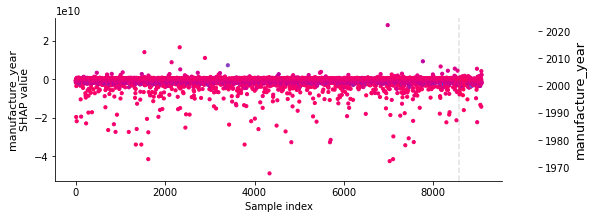

At 8583, Welch's t-test detects feature values' mean difference with a p-value of 1.722e-129


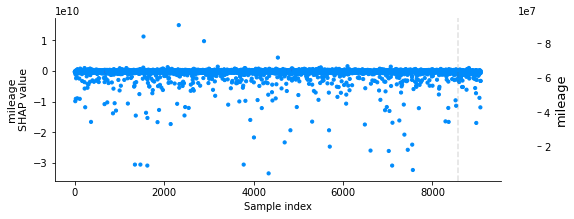

At 8583, Welch's t-test detects SHAP loss values' mean difference with a p-value of 1.05e-34


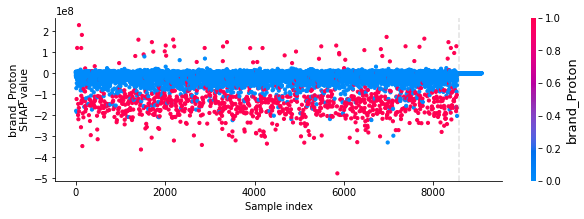

At 8583, chi-squared test detects feature values' mean difference with a p-value of 1.903e-05


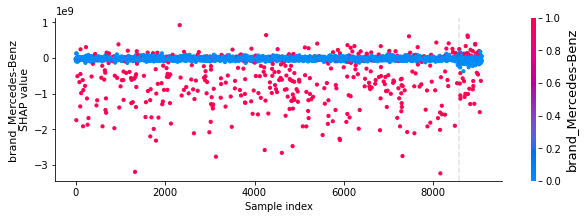

In [44]:
for feature_name in modified_features:
    plot_shap_monitoring(
        feature_name, 
        shap_values_list = [
            cp_shap_loss_values_train, 
            cp_shap_loss_values_test_drifted
        ], 
        features_list = [
            cp_X_train, 
            cp_X_test_drifted
        ], 
        feature_names = cp_X_train.columns.tolist()
    )

Below are the SHAP loss monitoring plots constructed using Plotly.

In [45]:
shap_monitoring_figs = []

for feature_name in modified_features:
    fig, alarm_info = plot_shap_monitoring_plot_plotly(
        feature_name = feature_name,
        shap_values_list = [
            cp_shap_loss_values_train, 
            cp_shap_loss_values_test_drifted
        ],
        features_list = [
            cp_X_train, 
            cp_X_test_drifted
        ], 
        feature_names = cp_X_train.columns.tolist(), 
        feature_label_names = feature_label_names
    )
    shap_monitoring_figs.append(fig)
    if 'message' in alarm_info:
        print(alarm_info['message'])
    fig.show()

At 8583, Welch's t-test detects feature values' mean difference with a p-value of 3.963e-19


At 8583, Welch's t-test detects feature values' mean difference with a p-value of 1.722e-129


At 8583, Welch's t-test detects SHAP loss values' mean difference with a p-value of 1.05e-34


At 8583, chi-squared test detects feature values' mean difference with a p-value of 1.903e-05


The Plotly figure is exported to a HTML document for preview.

In [46]:
shap_monitoring_figs[0].write_html(
    file = f'{OUT_FOLDER_PATH}/shap_loss_monitoring_plot_full.html', 
    include_plotlyjs=True, 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=True, 
    auto_open=AUTO_OPEN, 
)

The Plotly figure is exported to a div element. A script tag that contains the JavaScript code to construct the Plotly figure in that div element is also exported as well.

In [47]:
total_bytes = 0

for fig in shap_monitoring_figs:
    fig_html = fig.to_html(
        include_plotlyjs='cdn', 
        default_width='100%', 
        default_height='100%', 
        validate=True, 
        full_html=False, 
    )
    total_bytes += len(fig_html.encode("utf-8"))

print(f'The average size of the HTML code is {round(total_bytes/len(shap_monitoring_figs)/1000, 1)}KB.')
if PRINT_HTML:
    print(fig_html)

The average size of the HTML code is 379.7KB.


### Implementation

It takes around 30 seconds to run the SHAP loss monitoring funciton if the full train set (8533 samples) is used as the validation set. Besides, it even takes up to few minutes to run the function if all the features (76 features) are evaluated.

To reduce the computation time:
1. Only the top 20 features with highest positive SHAP loss values are considered in the test set.
2. Since the application data is around 547 samples, only 600 samples out of 8533 samples in the train set are used as the validation set.
3. Note that the result might not be accurate since the variance increases as less samples are used in the validation set. 

In [48]:
# To reduce the computation time, only the top 20 features with highest positive SHAP loss values are considered
shap_loss_values = pd.DataFrame(cp_shap_loss_values_test_drifted, columns = cp_X_train.columns)
shap_loss_values_summed = shap_loss_values.apply(lambda col: col[col >= 0.0].sum(), axis=0)
top_20_inaccurate_features = shap_loss_values_summed.sort_values(ascending=False).index.tolist()[:20]
top_20_inaccurate_features

['manufacture_year',
 'direct_injection_Multi-Point Injected',
 'width_mm',
 'fuel_type_Diesel',
 'assembled_Locally Built',
 'wheel_base_mm',
 'assembled_Parallel Import',
 'peak_power_hp',
 'height_mm',
 'peak_torque_nm',
 'mileage',
 'doors',
 'direct_injection_Direct Injection',
 'brand_Mercedes-Benz',
 'brand_Toyota',
 'fuel_type_Petrol - Unleaded (ULP)',
 'length_mm',
 'engine_cc',
 'colour_Yellow',
 'aspiration_Aspirated']

In [49]:
# Only 600 samples in the train set are used as the validation set
MAX_TRAIN_SAMPLES = 600

tree_loss_explainer_train = shap.TreeExplainer(
    model = cp_arf_dict, 
    feature_perturbation = 'interventional', 
    model_output = 'log_loss',
    data = cp_X_train_subsample)

cp_shap_loss_values_train_sub = tree_loss_explainer_train.shap_values(
    cp_X_train[:MAX_TRAIN_SAMPLES], 
    cp_y_train[:MAX_TRAIN_SAMPLES]
)

Unfortunately, the `brand_Proton` is not evaluated since `brand_Proton` is not the top 20 features with highest positive SHAP loss values. As a result, the implementation is not able to reach its full potential in exchange of faster computation time. In production, the author recommended to set up scalable virtual machines in the cloud to periodically run the SHAP monitoring function and store the results in cloud database in advance. As a result, the data scientists don't have to wait for the computation to complete when they request for it.

The result shows that the the proposed function can raise alarms on the `manufacture_year` and `mileage` using Welch's t-test. The result also shows that more false positive alarms are triggered. One way to solve this is by using a more stricter p-value to reduce these false positives.

In [50]:
start = time.time()

shap_monitoring_fig_htmls = []
alarms = []
problematic_cols = []
alarm_types = []

for idx, feature_name in enumerate(top_20_inaccurate_features):
    # Call the SHAP monitoring function
    _, alarm_info = get_shap_monitoring_plot_data(
        feature_name = feature_name,
        shap_values_list = [
            cp_shap_loss_values_train_sub,
            cp_shap_loss_values_test_drifted
        ],
        features_list = [
            cp_X_train[:MAX_TRAIN_SAMPLES], 
            cp_X_test_drifted
        ], 
        feature_names = cp_X_train.columns.tolist(), 
        increment = 250
    )
    alarms.append(alarm_info)
    if 'p-value' in alarm_info:
        # If the alarm is triggered
        print(f'\nDrift/data error detected at top {idx+1} feature, {feature_name}:')
        print(f'\t{alarm_info["message"]}')
        # Save the alarm information
        problematic_cols.append(feature_name)
        alarm_types.append(alarm_info['type'])

end = time.time()
print(f'\nExecution time: {end - start}seconds')


Drift/data error detected at top 1 feature, manufacture_year:
	At 850, Welch's t-test detects feature values' mean difference with a p-value of 1.52e-13

Drift/data error detected at top 2 feature, direct_injection_Multi-Point Injected:
	At 850, Welch's t-test detects feature values' mean difference with a p-value of 0.0429

Drift/data error detected at top 4 feature, fuel_type_Diesel:
	At 1100, chi-squared test detects feature values' mean difference with a p-value of 0.03509

Drift/data error detected at top 6 feature, wheel_base_mm:
	At 850, Welch's t-test detects SHAP loss values' mean difference with a p-value of 8.821e-05

Drift/data error detected at top 11 feature, mileage:
	At 850, Welch's t-test detects feature values' mean difference with a p-value of 3.417e-52

Drift/data error detected at top 13 feature, direct_injection_Direct Injection:
	At 850, chi-squared test detects feature values' mean difference with a p-value of 0.005952

Drift/data error detected at top 14 featu

# Local Explanation

## Bar plot

There are various plot types like waterfall plot, force plot, bar plot, decision plot and more that is useful to provide explanation at a sample level. In comparions with other plot types, bar plot is chosen since the plot can present the local explanation very clearly to the audience when the number of features displayed is high.

As shown below, the bar plot can visualize both SHAP values and SHAP loss values. In web application, SHAP values are visualized when the users request for explanation on the car price prediction. SHAP loss values are visualized when the data scientists want to know which features contribute to the prediction error and which features help reducing the prediction error. 

In the bar plots, the feature with the highest absolute SHAP values is displayed at the top, followed by the next highest absolute SHAP values in a top-down fashion. In both plots, the red bar represents positive SHAP values while the blue bar represents negative SHAP values. However, the red and blue bar presents different meaning in both plots, respectively. For bar plot visualizing SHAP values, the red bar means the positive contribution of the feature to the difference between the current predicted price and expected price, while the blue bar means the negative contribution. For bar plot visualizing SHAP loss values, the red bar means that the feature contribute to the prediction error while the blue bar means that the feature help reducing the prediction error.

The data scientists can derive more useful insights when comparing both bar plots side by side. The examples are shown in the following cells.

This example shows an accurate prediction. For this sample, `direct_injection_Multi-Point Injected` is the feature that contribute the **most** in the car price prediction. Among the top ten features with the highest absolute SHAP loss value, none of these features contribute to the **errors** in the car price prediction. 


Local explanation for car price prediction:


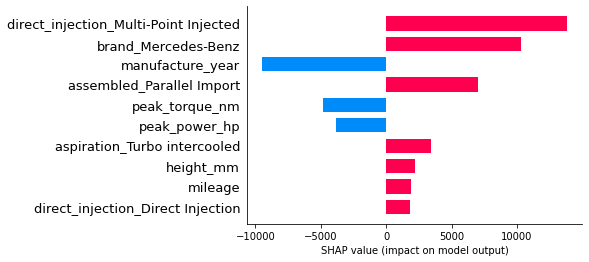


Local explanation for car price prediction error:


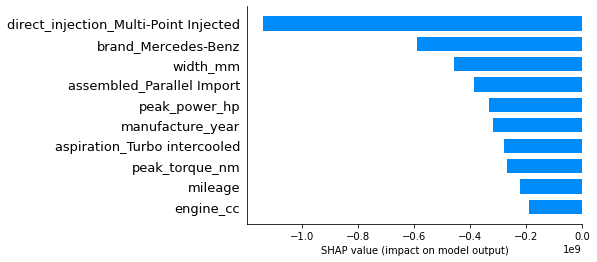

In [51]:
print('\nLocal explanation for car price prediction:')
shap.bar_plot(cp_shap_values[42], feature_names=cp_data_pp.features, max_display=10)
print('\nLocal explanation for car price prediction error:')
shap.bar_plot(cp_shap_loss_values[42], feature_names=cp_data_pp.features, max_display=10)

This example shows an inaccurate prediction. For this sample, `aspiration_Twin Turbo intercooled` and `peak_power_hp` are the top two features that contribute the **most** in the car price prediction. Out of the top ten features with the highest absolute SHAP loss value, the `manufacture_year`, `mileage`, and `height_mm` are the only features that are not contributing to the **errors** in the car price prediction. Since the current sample is the test sample, it is possible that the model is not sufficiently trained with samples that represent this sample. It is also possible that the sample is a drifted sample, errored sample, or a malicious sample. Further investigation is required but the investigation is not covered since it is out of scope.


Local explanation for car price prediction:


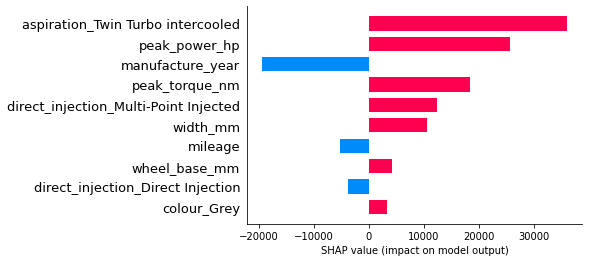


Local explanation for car price prediction error:


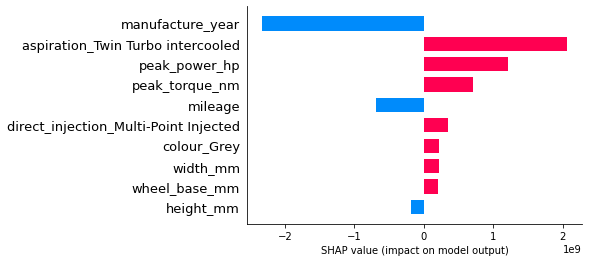

In [52]:
print('\nLocal explanation for car price prediction:')
shap.bar_plot(cp_shap_values[51], feature_names=cp_data_pp.features, max_display=10)
print('\nLocal explanation for car price prediction error:')
shap.bar_plot(cp_shap_loss_values[51], feature_names=cp_data_pp.features, max_display=10)

Below are the bar plots constructed using Plotly.

In [53]:
indexes = [42, 51]

local_shap_bar_figs = []
local_shap_loss_bar_figs = []

for index in indexes:
    print(f'Local explanation for car price prediction at {index+1}th sample:')
    fig = plot_local_bar_plot_plotly(
        shap_values = cp_shap_values[index],
        features = cp_X_test_truth_av.values[index, :],
        feature_names = cp_X_test_truth_av.columns.tolist(), 
        feature_label_names = feature_label_names
    )
    fig.show()
    
    print(f'Local explanation for car price prediction error at {index+1}th sample:')
    loss_fig = plot_local_bar_plot_plotly(
        shap_values = cp_shap_loss_values[index],
        features = cp_X_test_truth_av.values[index, :],
        feature_names = cp_X_test_truth_av.columns.tolist(), 
        feature_label_names = feature_label_names
    )
    loss_fig.show()
    
    local_shap_bar_figs.append(fig)
    local_shap_loss_bar_figs.append(loss_fig)

Local explanation for car price prediction at 43th sample:


Local explanation for car price prediction error at 43th sample:


Local explanation for car price prediction at 52th sample:


Local explanation for car price prediction error at 52th sample:


The Plotly figure is exported to a HTML document for preview.

In [54]:
local_shap_bar_figs[0].write_html(
    file = f'{OUT_FOLDER_PATH}/local_shap_bar_plot_full.html', 
    include_plotlyjs=True, 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=True, 
    auto_open=AUTO_OPEN, 
)

local_shap_loss_bar_figs[0].write_html(
    file = f'{OUT_FOLDER_PATH}/local_shap_loss_bar_plot_full.html', 
    include_plotlyjs=True, 
    default_width='100%', 
    default_height='100%', 
    validate=True, 
    full_html=True, 
    auto_open=AUTO_OPEN, 
)

The Plotly figure is exported to a div element. A script tag that contains the JavaScript code to construct the Plotly figure in that div element is also exported as well.

In [55]:
total_bytes = 0

for fig in local_shap_bar_figs:
    fig_html = fig.to_html(
        include_plotlyjs='cdn', 
        default_width='100%', 
        default_height='100%', 
        validate=True, 
        full_html=False, 
    )
    total_bytes += len(fig_html.encode("utf-8"))

print(f'The average size of the HTML code is {round(total_bytes/len(shap_monitoring_figs)/1000, 1)}KB.')
if PRINT_HTML:
    print(fig_html)

The average size of the HTML code is 5.2KB.


In [56]:
total_bytes = 0

for fig in local_shap_loss_bar_figs:
    fig_html = fig.to_html(
        include_plotlyjs='cdn', 
        default_width='100%', 
        default_height='100%', 
        validate=True, 
        full_html=False, 
    )
    total_bytes += len(fig_html.encode("utf-8"))

print(f'The average size of the HTML code is {round(total_bytes/len(shap_monitoring_figs)/1000, 1)}KB.')
if PRINT_HTML:
    print(fig_html)

The average size of the HTML code is 5.2KB.


Thank you for reading.